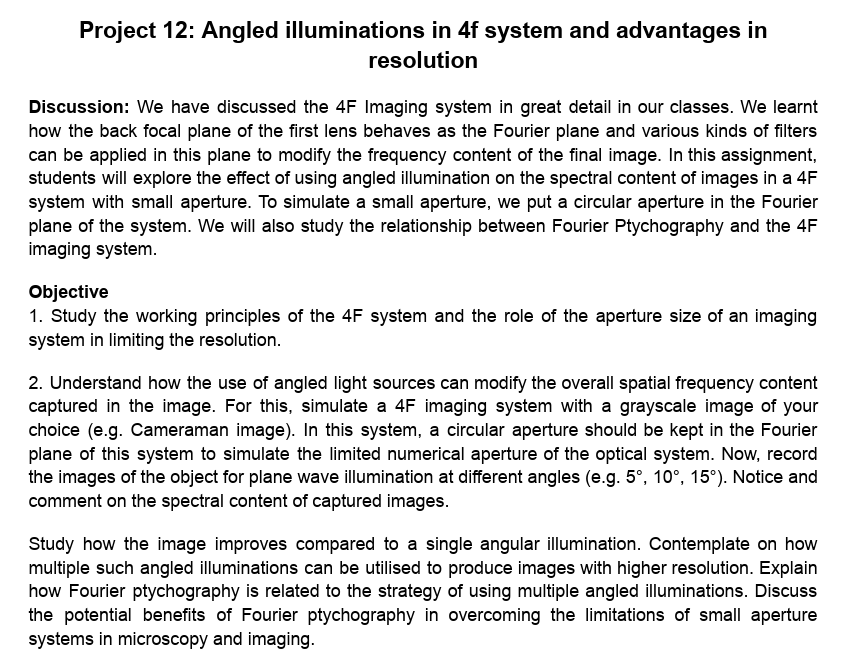

## Importing the libraries:

In [1]:
from numpy.fft import fft2,ifft2,fftshift,ifftshift ## fourier transform operations
import matplotlib.pyplot as plt                     ## for plotting
import numpy as np                                  ## for numerical calculation 
import scipy                                        ## only used for fftconvolve
plt.style.use('seaborn-v0_8-poster')

## Please note: This notebook has been programmed to handle square images only.

## Creating a class which simulates physical imaging systems. It can simulate:-
###  1. Fraunhoffer Diffraction
###  2. Fresnel Diffraction
###  3. Propagation of light in air/vacuum using ASM(angular spectrum method).
###  4. Low pass filter
###  5. Lens action
###  6. 4f system
## It also has many methods for processing data (helping functions)

In [ ]:
class fourier_optics:

    def __init__(self,file,mode,ld=500,p=3):
        '''
        reads the image file and initializes the object
        arguments:-
        file: either ndarray or str (the name of the image file)
        mode: str, the mode of the image, 'grayscale' or 'rgb'
        ld: float, wavelength of the light in nm. Default is 500 nm
        p: float, pixel size in micrometer. Default is 3 micrometer


        returns: ndarray, the image data in the desired mode
        '''



        ## Our class supports 2 input formats- either string(filename) or numpy array:
        if type(file)==np.ndarray:
            self.data=np.array(file)
        else:
            ## if file is being and it is rgb, we have to convert it into grayscale:
            if mode not in ['grayscale','rgb']:
                raise ValueError('mode must be "grayscale" or "rgb"')
            
            self.data=plt.imread(file)
            if mode=='rgb':
                self.data=0.2989 * self.data[:,:,0] + 0.5870 * self.data[:,:,1] + 0.1140 * self.data[:,:,2]
            elif mode=='grayscale':
                pass
        
        ## We create several attributes that are required later.
        self.mode=mode
        self.ld=ld*(1e-9)
        self.p=p*(1e-6)
        self.k=2*np.pi/self.ld
        self.dx=self.dy=self.p
        N=self.data.shape[1]
        x=np.arange(-N/2,N/2,1)*self.dx
        y=np.arange(-N/2,N/2,1)*self.dy
        x,y=np.meshgrid(x,y)
        self.x=x
        self.y=y
        fX=np.arange(-1/2,1/2,1/N)/self.dx
        fY=np.arange(-1/2,1/2,1/N)/self.dy
        fX,fY=np.meshgrid(fX,fY)
        self.fX=fX
        self.fY=fY

    def deep_copy(self):
        '''
        returns a deep copy of the object
        arguments: None
        returns: fourier_optics object
        '''
        return fourier_optics(self.data,'grayscale',self.ld/(1e-9),self.p/(1e-6))

    def fourier_transform(self):
        '''
        returns the fourier transform of the image
        arguments: None
        returns fourier transform of the image
        '''
        return fftshift(fft2(ifftshift(self.data)))
        
    def fraunhoffer_diffraction(self):
        '''
        returns the fraunhoffer diffraction pattern of the image
        arguments: None
        returns: fraunhoffer diffraction pattern of the image
        '''
        return self.fourier_transform()
    
    def fresnel_diff(self,z):
        '''
        returns fresnel diffraction pattern of the image at a distance z
        arguments:
        z: float, distance of propagation in meters
        returns: fresnel diffraction pattern of the image at a distance z
        '''
        self.fourier_transform()
        alpha=np.sqrt(self.k**2-(4*(np.pi**2)*(self.fX**2+self.fY**2)))
        H=np.exp(1j*alpha*z)
        self.data*=H
        output=fftshift(ifft2(ifftshift(self.data)))
        return output
    
    def add_padding(self,pad_th):
        '''
        adds padding to the image
        arguments:
        pad_th: int, the padding thickness
        returns: None
        '''
        self.data=np.pad(self.data,pad_th)
        N=np.shape(self.data)[0]
        x=np.arange(-N/2,N/2,1)*self.dx
        y=np.arange(-N/2,N/2,1)*self.dy
        x,y=np.meshgrid(x,y)
        self.x=x
        self.y=y
        fX=np.arange(-1/2,1/2,1/N)/self.dx
        fY=np.arange(-1/2,1/2,1/N)/self.dy
        fX,fY=np.meshgrid(fX,fY)
        self.fX=fX
        self.fY=fY

    def remove_padding(self,pad_th):
        '''
        removes padding from the image
        arguments:
        pad_th: int, the padding thickness
        returns: None
        '''
        self.data=self.data[pad_th:-pad_th,pad_th:-pad_th]
        N=np.shape(self.data)[0]
        x=np.arange(-N/2,N/2,1)*self.dx
        y=np.arange(-N/2,N/2,1)*self.dy
        x,y=np.meshgrid(x,y)
        self.x=x
        self.y=y
        fX=np.arange(-1/2,1/2,1/N)/self.dx
        fY=np.arange(-1/2,1/2,1/N)/self.dy
        fX,fY=np.meshgrid(fX,fY)
        self.fX=fX
        self.fY=fY

    def angled_illumination_phi(self,theta:float,phi:float):
        '''
        simulates the effect of angled illumination
        arguments:
        theta: float, Polar angle- the angle of illumination w.r.t. z-axis (in degrees)
        phi: float, Azimuthal angle- the direction of angled illumination in xy plane wrt +ve x-axis (in degrees)
        '''
        I0=self.data
        theta=np.pi*theta/180
        phi=np.pi*phi/180
        I=I0*np.exp(1j*self.k*(np.sin(theta)*(self.x*np.cos(phi)+self.y*np.sin(phi))))
        self.data=I

    def image_data(self):
        '''
        returns the image data
        arguments: None
        returns: ndarray, the image data
        '''
        return self.data
    
    def ASM(self,z):
        ''' This function computes the output image based on the angular spreading of the light waves
            corresponding to the transmittance function; A.K.A Fresnel Diffraction
        '''
        inp=self.data
        F_inp=fftshift(fft2(ifftshift(inp)))
        alpha=np.sqrt(self.k**2-4*np.pi**2*(self.fX**2+self.fY**2))
        H=np.exp(1j*alpha*z)
        F_out=F_inp*H
        out=fftshift(ifft2(ifftshift(F_out)))
        self.data=out
    
    def Lens(self,f):
        '''
        This function computes the image, at f, of an object place at f.
        Arguments:
        f: focal length of the lens
        '''
        self.ASM(f)
        lens_trans=np.exp(-1j*np.pi*(self.x**2+self.y**2)/(self.ld*f))
        self.data*=lens_trans 
        self.ASM(f)
        
    def low_pass(self,f_max):
        '''
        simulates the effect of a low pass filter.
        arguments:
        f_max: maximum allowed frequency
        '''
        lp=np.where((self.fX**2+self.fY**2)<=f_max**2,1,0)
        self.data*=lp

    def four_f_system(self,f,f_max):
        '''
        simulates the effect of a 4f system
        arguments:
        f: float, focal length of the lens
        f_max: float, cut-off frequency of the low pass filter
        returns: None
        '''
        self.Lens(f)
        self.low_pass(f_max)
        self.Lens(f)
    
    def normalize(self):
        '''
        normalizes the image data. Maps the data range to 0-1.
        arguments: None
        returns: None
        '''
        self.data=(self.data-np.min(self.data))/(np.max(self.data)-np.min(self.data))
    

## Understanding how angled illumination changes frequency content of the captured image:

### a) using angled illumination along x-axis:

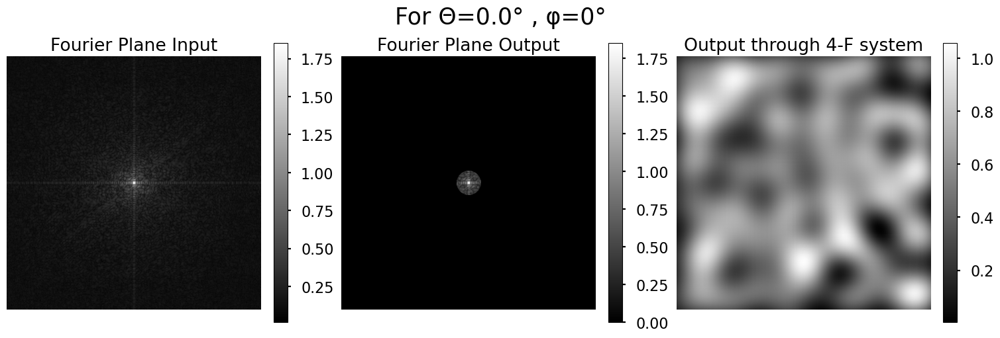

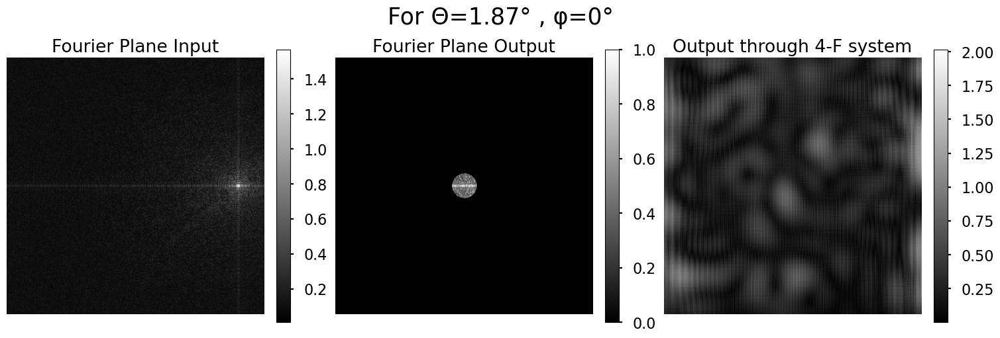

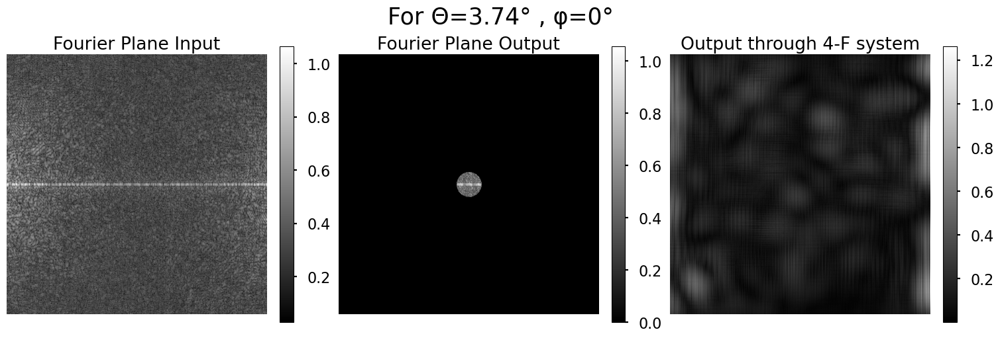

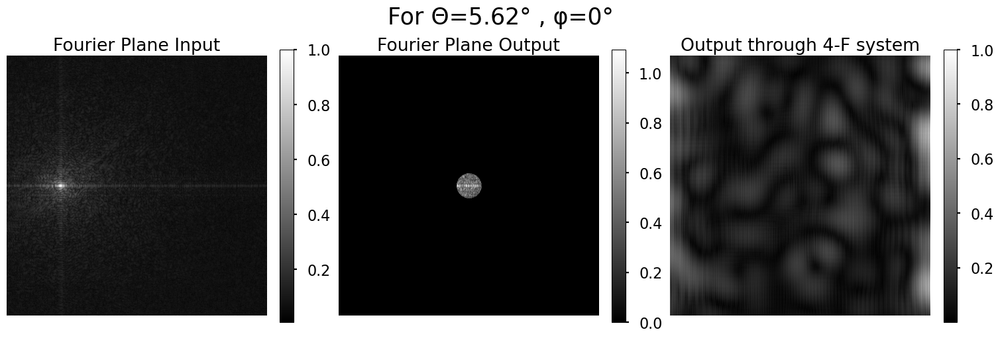

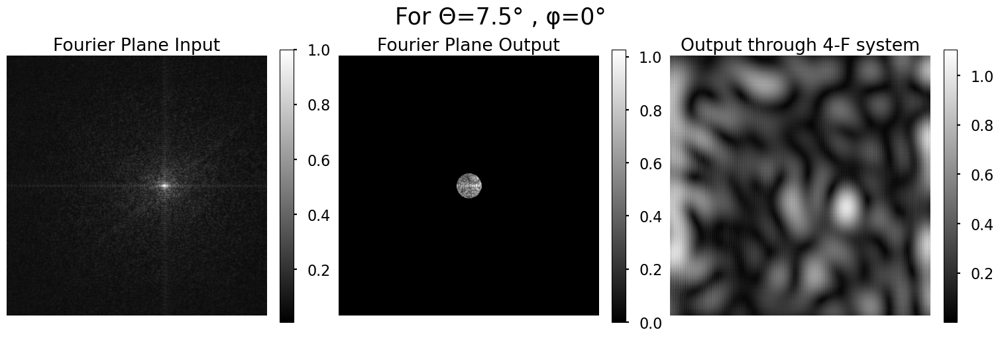

In [6]:
## initializing values
f=10e-3;f_max=2e4       ## f is focal length and f_max is maximum frequency allowed in fourier aperture.

## creating the object
img=fourier_optics('microscope sample.jpg','rgb',550,1.6) ## initializing fourier_optics object

## preprocessing data
img.normalize()
img.add_padding(128)


sin_theta_range=np.linspace(0,np.sin(7.5*np.pi/180),5)  ## we are selecting sin(Θ) range insted of Θ range so that different
                                                        ## angled illumination are equidistant in fourier domain. 
ang_range=np.arcsin(sin_theta_range)*180/np.pi

for ang in ang_range:
    plt.figure(figsize=(15,5),layout='constrained')

    img1=img.deep_copy()    ## we are creating a deep copy of data for this particular illumination so that original data is not modified.
    img1.angled_illumination_phi(ang,0)
    img1.Lens(f)
    img1.remove_padding(128)
    plt.subplot(1,3,1),plt.imshow(abs(img1.image_data()/np.max(img1.image_data()))**0.4,cmap='gray'),plt.axis(False),plt.title('Fourier Plane Input'),plt.colorbar()
    img1.add_padding(128)

    img1.low_pass(f_max)
    img1.remove_padding(128)
    plt.subplot(1,3,2),plt.imshow(abs(img1.image_data()/np.max(img1.image_data()))**0.4,cmap='gray'),plt.axis(False),plt.title('Fourier Plane Output'),plt.colorbar()
    img1.add_padding(128)


    img1.Lens(f)
    img1.remove_padding(128)
    img1.data=img1.data/np.max(img1.data)
    img1=abs(img1.image_data())
    plt.subplot(1,3,3),plt.imshow(img1,cmap='gray'),plt.axis(False),plt.title('Output through 4-F system'),plt.colorbar()


    plt.suptitle(f'For Θ={np.round(ang,2)}° , φ=0°',fontsize=25,fontweight=20)
    plt.show()

### b) using angled illumination along y-axis:

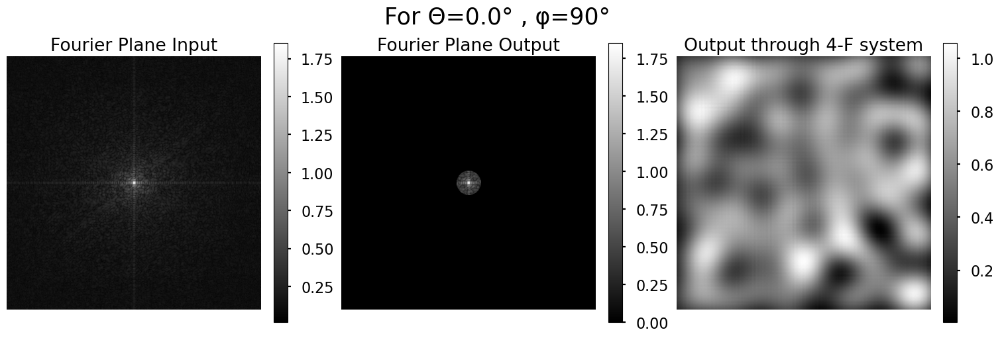

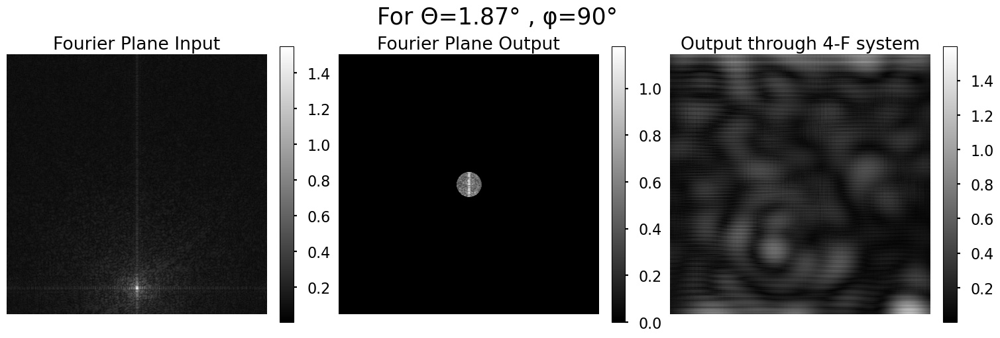

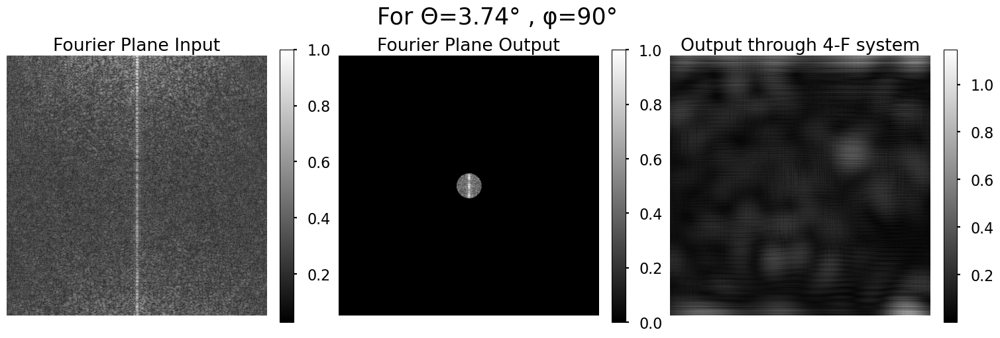

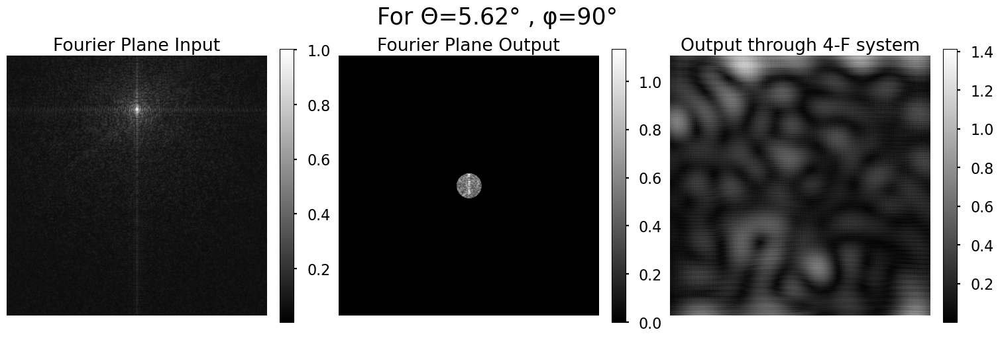

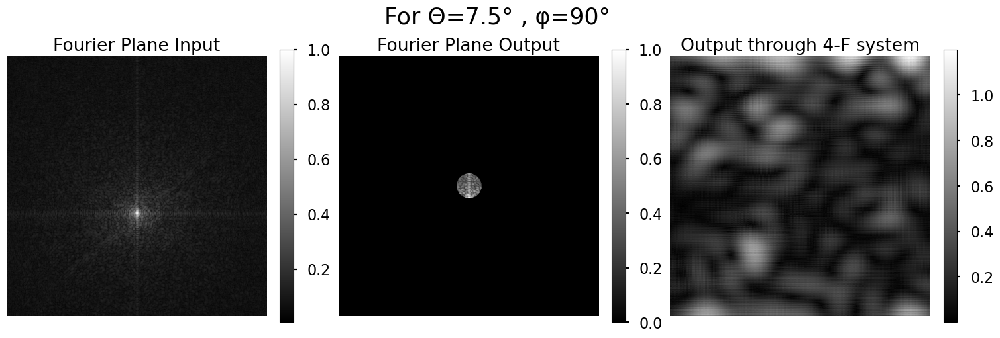

In [7]:
## initializing values
f=10e-3;f_max=2e4

## creating the object
img=fourier_optics('microscope sample.jpg','rgb',550,1.6) ## initializing fourier_optics object

## preprocessing data
img.normalize()
img.add_padding(128)


sin_theta_range=np.linspace(0,np.sin(7.5*np.pi/180),5)  ## we are selecting sin(Θ) range insted of Θ range so that different
                                                        ## angled illumination are equidistant in fourier domain.
ang_range=np.arcsin(sin_theta_range)*180/np.pi

for ang in ang_range:
    plt.figure(figsize=(15,5),layout='constrained')

    img1=img.deep_copy()    ## we are creating a deep copy of data for this particular illumination so that original data is not modified.
    img1.angled_illumination_phi(ang,90)
    img1.Lens(f)
    img1.remove_padding(128)
    plt.subplot(1,3,1),plt.imshow(abs(img1.image_data()/np.max(img1.image_data()))**0.4,cmap='gray'),plt.axis(False),plt.title('Fourier Plane Input'),plt.colorbar()
    img1.add_padding(128)

    img1.low_pass(f_max)
    img1.remove_padding(128)
    plt.subplot(1,3,2),plt.imshow(abs(img1.image_data()/np.max(img1.image_data()))**0.4,cmap='gray'),plt.axis(False),plt.title('Fourier Plane Output'),plt.colorbar()
    img1.add_padding(128)


    img1.Lens(f)
    img1.remove_padding(128)
    img1.data=img1.data/np.max(img1.data)
    img1=abs(img1.image_data())
    plt.subplot(1,3,3),plt.imshow(img1,cmap='gray'),plt.axis(False),plt.title('Output through 4-F system'),plt.colorbar()


    plt.suptitle(f'For Θ={np.round(ang,2)}° , φ=90° ',fontsize=25,fontweight=20)
    plt.show()

### c) using angled illumination along $45\degree $ w.r.t. x-axis

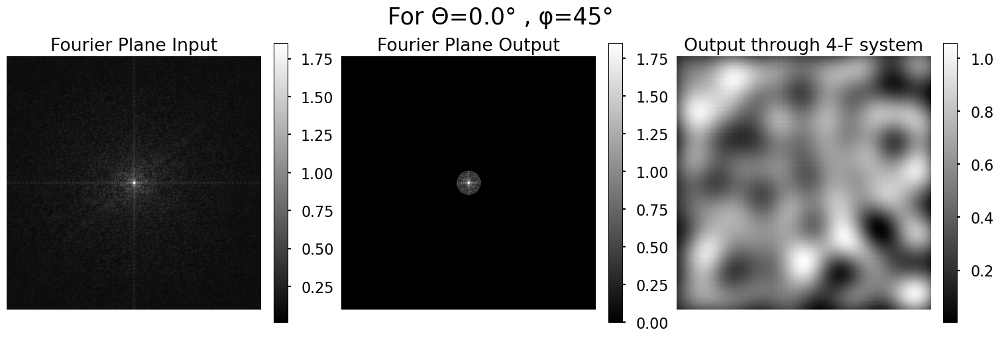

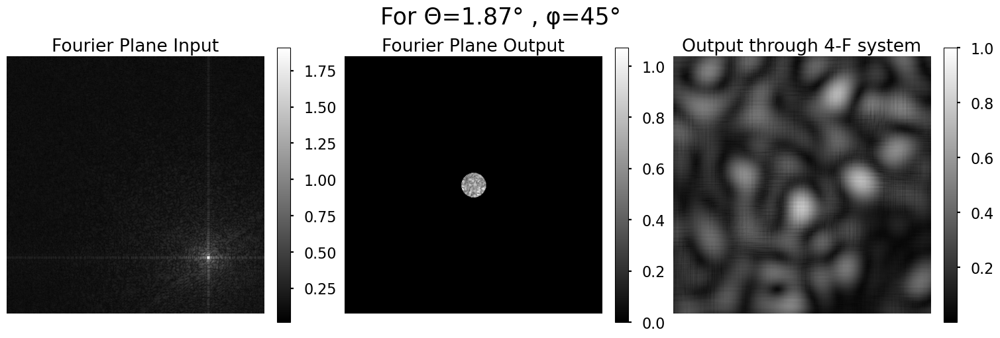

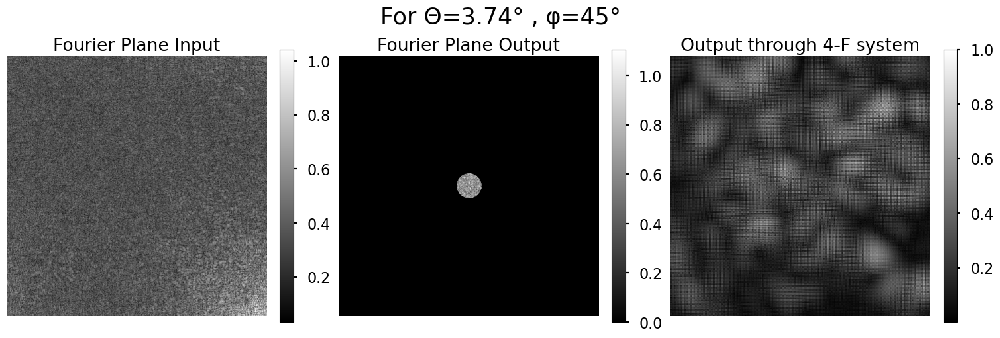

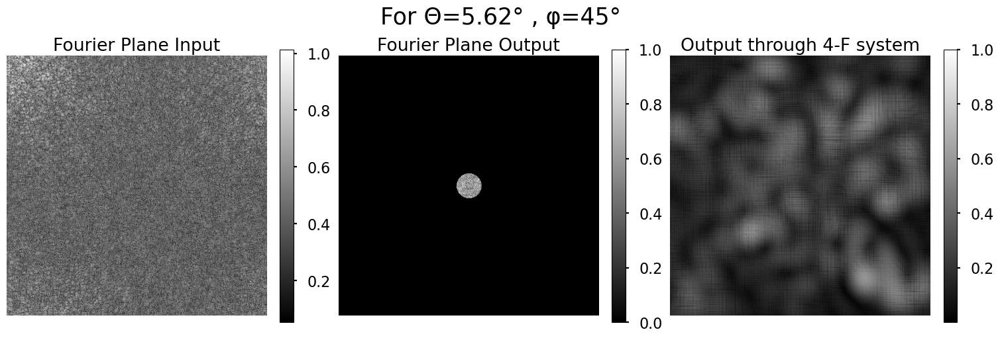

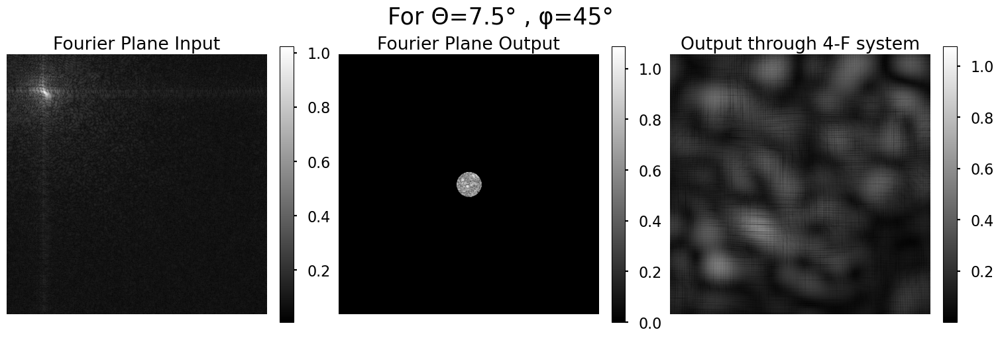

In [8]:
## initializing values
f=10e-3;f_max=2e4

## creating the object
img=fourier_optics('microscope sample.jpg','rgb',550,1.6) ## initializing fourier_optics object

## preprocessing data
img.normalize()
img.add_padding(128)


sin_theta_range=np.linspace(0,np.sin(7.5*np.pi/180),5)  ## we are selecting sin(Θ) range insted of Θ range so that different
                                                        ## angled illumination are equidistant in fourier domain.
ang_range=np.arcsin(sin_theta_range)*180/np.pi

for ang in ang_range:
    plt.figure(figsize=(15,5),layout='constrained')

    img1=img.deep_copy()    ## we are creating a deep copy of data for this particular illumination so that original data is not modified.
    img1.angled_illumination_phi(ang,45)
    img1.Lens(f)
    img1.remove_padding(128)
    plt.subplot(1,3,1),plt.imshow(abs(img1.image_data()/np.max(img1.image_data()))**0.4,cmap='gray'),plt.axis(False),plt.title('Fourier Plane Input'),plt.colorbar()
    img1.add_padding(128)

    img1.low_pass(f_max)
    img1.remove_padding(128)
    plt.subplot(1,3,2),plt.imshow(abs(img1.image_data()/np.max(img1.image_data()))**0.4,cmap='gray'),plt.axis(False),plt.title('Fourier Plane Output'),plt.colorbar()
    img1.add_padding(128)


    img1.Lens(f)
    img1.remove_padding(128)
    img1.data=img1.data/np.max(img1.data)
    img1=abs(img1.image_data())
    plt.subplot(1,3,3),plt.imshow(img1,cmap='gray'),plt.axis(False),plt.title('Output through 4-F system'),plt.colorbar()


    plt.suptitle(f'For Θ={np.round(ang,2)}° , φ=45°',fontsize=25,fontweight=20)
    plt.show()

# Implementing Fourier Ptychography (additional part in addition to project):-

In [ ]:
def ptychography(file_name:str,ld: float,p: float,focal_l:float,max_frequency:float,mode:str,multiple_of_max_freq:int =3,plot_graph:bool=True):
    '''
    This function performs the ptychography algorithm in order to increase the resolution of the image.
    Arguments:-
    file_name:              name of the image file on which ptychography has to be demostrated
    ld:                     wavelength of illuminating light(in nm)
    p:                      pixel size (in micrometer)
    focal_l:                focal length (in m)
    max_frequency:          maximum frequency allowed in fourier plane. It simulates the effect of low numerical aperture.
    multiple_of_max_freq:   Maximum frequency you wish to capture devided by max_frequency.
    plot_graph:             Whether you want to plot the results or not.
    '''
    def fft(data):
        return fftshift(fft2(ifftshift(data)))
    
    def ifft(data):
        return fftshift(ifft2(ifftshift(data)))
    
    ##prepocess data
    data_padded=fourier_optics(file_name,mode=mode,ld=ld,p=p)
    data_padded.add_padding(128)
    data_padded.normalize()
    new_data=data_padded.data

    ##initializing data required for processing later.
    delta=np.zeros(np.shape(data_padded.fX))
    N=np.shape(delta)[0]
    f_data_final=np.zeros(np.shape(delta),dtype=complex)
    d_f=data_padded.fX[0,1]-data_padded.fX[0,0]
    loc_of_1_f=(0.5*max_frequency/d_f)
    
    ##simulating angled illumination and capturing data using an imaging system-4f system
    for i in np.arange(-multiple_of_max_freq,multiple_of_max_freq+1):
        for j in np.arange(-multiple_of_max_freq,multiple_of_max_freq+1):

            '''**************************************************************************************************************'''
            '''calculating specifications of angled illumination'''
            ## calculating Θ
            r=np.sqrt(i**2+j**2)
            theta=np.arcsin(0.5*r*max_frequency*ld*1e-9)*180/np.pi
            
            ## calculating φ
            if i==0:
                if j==0:
                    phi=0
                elif j>0:
                    phi=90
                else:
                    phi=-90

            else:
                phi=np.arctan(j/i)*180/np.pi
                if i<0 and j<0:
                    phi+=180
                if i<0 and j>0:
                    phi+=180
                if j==0 and i<0:
                    phi=180
            '''**************************************************************************************************************'''

                

            ## simulating capturing the data
            angled_illumination=fourier_optics(new_data,'grayscale',ld,p)
            angled_illumination.angled_illumination_phi(theta,phi)
            angled_illumination.four_f_system(focal_l,max_frequency)


            ## post-processing the data obtained from the imaging system
            f_data=angled_illumination.data
            f_data=fft(f_data)
            lp=np.where((data_padded.fX**2+data_padded.fY**2)<=(max_frequency**2),1,0)
            f_data*=lp




            ''' superposing /stiching data together corresponding to different illumination in fourier domain.
            We do so by by moving the data centered at origin to (i,j)(if origin is at (0,0) ).
            This done by convolving the data with a delta function at (i,j).
            '''
            i_loc=int(np.round(i*loc_of_1_f,1))
            j_loc=int(np.round(j*loc_of_1_f,1))
            delta[N//2-1+j_loc,N//2-1+i_loc]=1                                  ##creating a delta function from zero matrix at (i,j)
            f_data=scipy.signal.fftconvolve(f_data,delta,mode='same')
            delta[N//2-1+j_loc,N//2-1+i_loc]=0                                  ##reseting the delta function to zero matrix for next iteration

            multiply_array=np.where(np.abs(f_data_final)<=np.abs(f_data),1,0)   ##To avoid adding overlapping area twice.
            f_data_final+=(f_data*multiply_array)                               ##Finally superposing

    if plot_graph:
        plt.figure(figsize=(20,20))
        
        ## Ptychography
        plt.subplot(222)
        plt.title("Fourier domain with ptychography")
        plot_data=f_data_final
        plot_data=np.abs(plot_data)
        plot_data=((plot_data-np.min(plot_data))/(np.max(plot_data)-np.min(plot_data)))
        plt.imshow(plot_data**0.4,cmap='gray')
        plt.colorbar()

        plt.subplot(224)
        plt.title("Image with ptychography")
        plot_data=ifft(f_data_final)
        plot_data=np.abs(plot_data)
        plot_data=((plot_data-np.min(plot_data))/(np.max(plot_data)-np.min(plot_data)))
        plt.imshow(plot_data[-129:127:-1,-129:127:-1],cmap='gray')
        plt.colorbar()
        
        ## for demostrating improvement
        plt.subplot(223)
        plt.title("Image without angled \n illumination & without ptychography")
        compare_data=fourier_optics(new_data,mode=mode,ld=ld,p=p)
        compare_data.four_f_system(focal_l,max_frequency)
        plot_data=compare_data.data
        plot_data=np.abs(plot_data)
        plot_data=((plot_data-np.min(plot_data))/(np.max(plot_data)-np.min(plot_data)))
        plt.imshow(plot_data[-129:127:-1,-129:127:-1],cmap='gray')
        plt.colorbar()

        plt.subplot(221)
        plot_data=fft(compare_data.data)
        plt.title("Fourier domain without angled \n illumination & without ptychography")
        plot_data=np.abs(plot_data)
        plot_data=((plot_data-np.min(plot_data))/(np.max(plot_data)-np.min(plot_data)))
        plt.imshow(plot_data**0.4,cmap='gray')
        plt.colorbar()


        plt.suptitle("Fourier Ptychography",fontsize=25,fontweight=20)
        plt.show()
    return f_data_final

### a) Demostrating fourier ptychography for graytest image

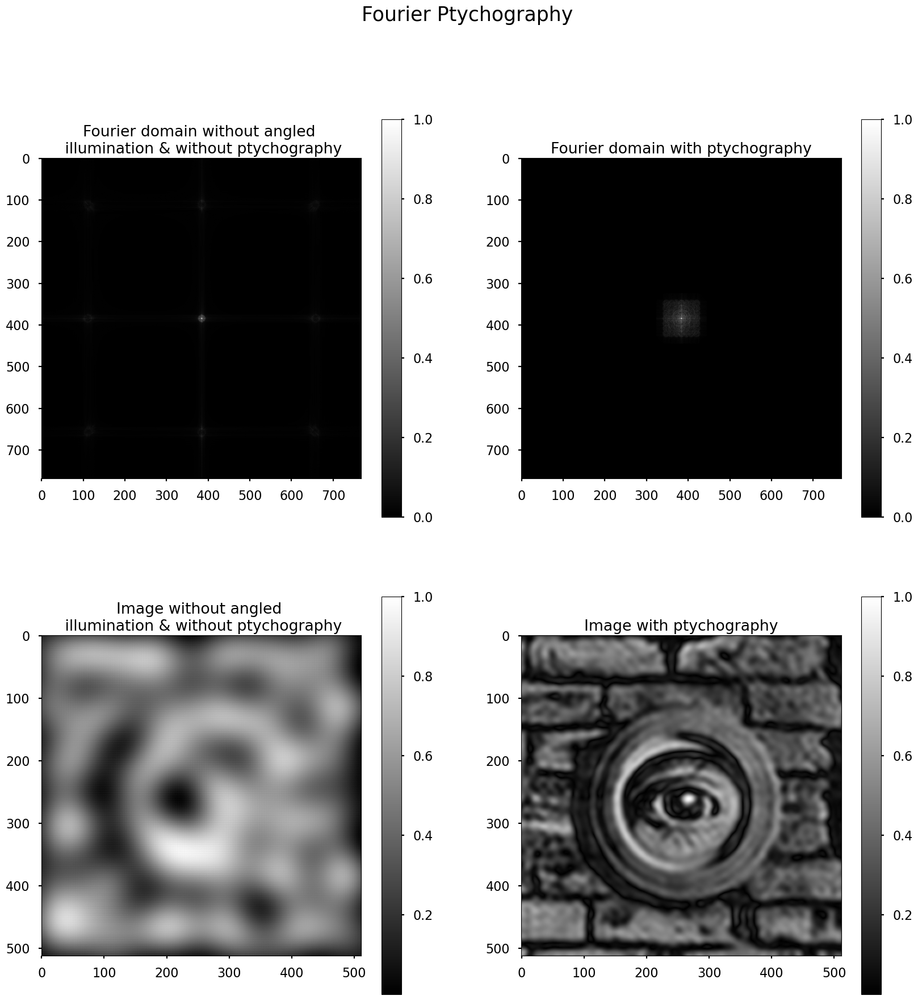

In [9]:
## initializing specifications
focal_l=10e-3;max_frequency=2e4;ld=550;p=1.6   #ld is in nm and p is in micron

## ptychography
high_res_image=ptychography('graytestimg.png',ld,p,focal_l,max_frequency,'rgb',3)

### b) Demostrating fourier ptychography for lena image

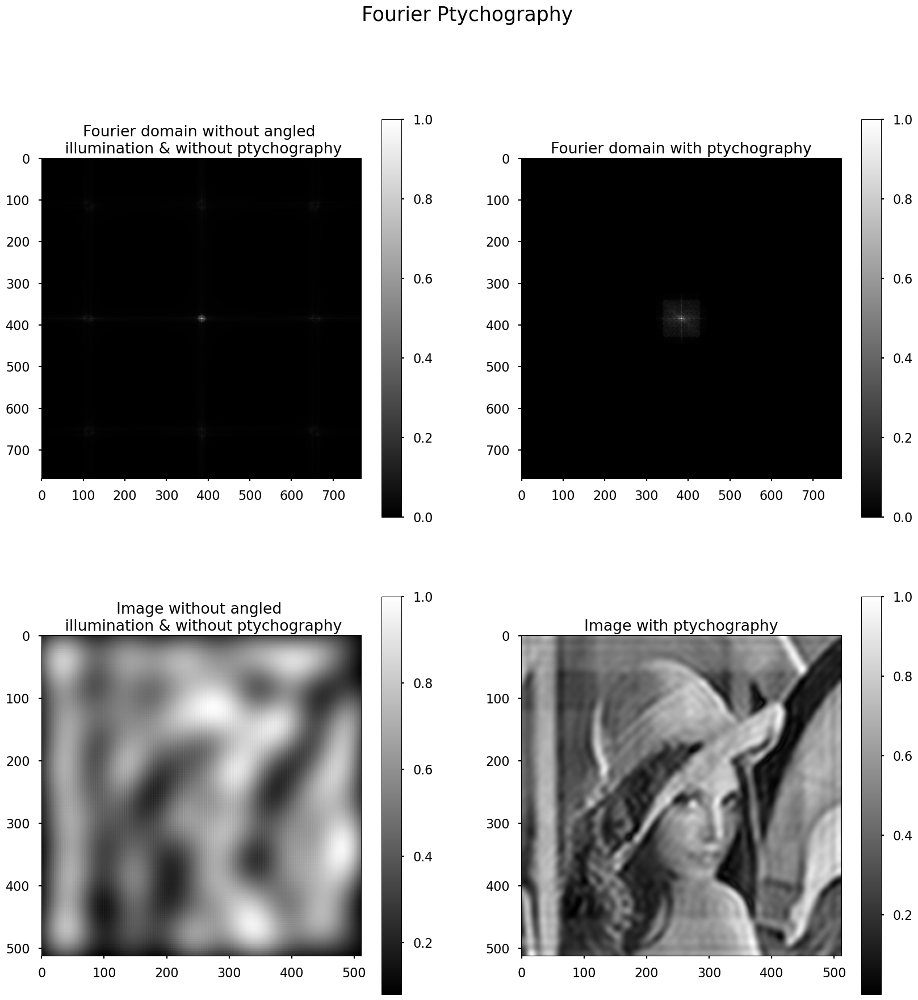

In [8]:
high_res_lena=ptychography('Lena Image.png',ld,p,focal_l,max_frequency,'rgb',3)

### c) Demostrating fourier ptychography for camera man image

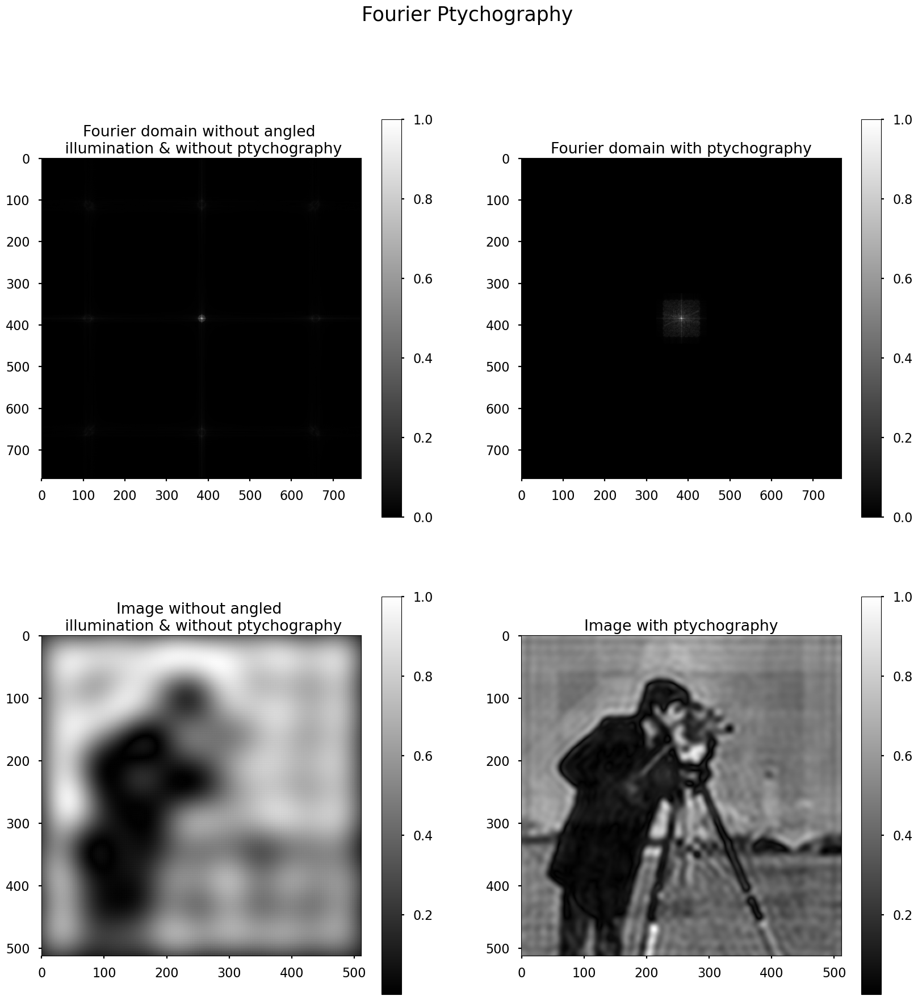

In [9]:
high_res_camera_man=ptychography('camera man image.jpeg',ld,p,focal_l,max_frequency,'grayscale',3)

### d) Demostrating fourier ptychography for microscope sample image

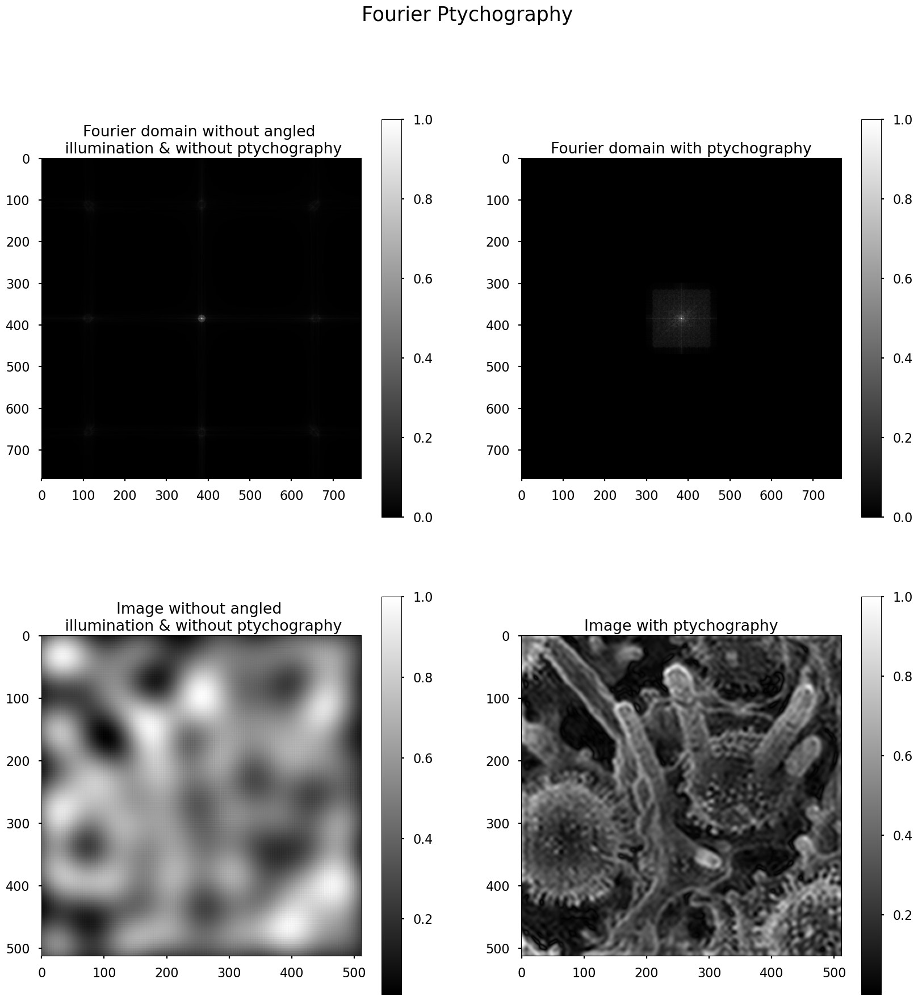

In [ ]:
high_res_micro=ptychography('microscope sample.jpg',ld,p,focal_l,max_frequency,'rgb',5)